# 03: Geoprocessing


## Goals

This notebook will walk through some common geoprocessing tasks using `geopandas`. These operations include:
- reprojecting data
- using a mask to clip data
- performing a spatial join
- performing an attribute join
- dissolving data
- unioning data
- writing functions to calculate new attributes

Together, these operations form the basis of many geospatial analyses. These tools are used to *explore* our datasets and the relationships between them, a common first step in any geospatial analysis.

## Import libraries


In [2]:
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
import geopandas as gpd
from lonboard._map import Map
from lonboard._layer import PolygonLayer
from lonboard.colormap import apply_categorical_cmap

In [3]:
# global map plot settings
plt.rcParams["figure.figsize"] = (10, 10)


# We are doing a lot of plotting, and at the scale we're working, we don't need to see coordinates on the axes.
# We can turn off the axes and ticks by default to keep the plots clean.
# Instead of running this cell, you could add `set_axis_off()` to each plot you create.


def set_axis_off():
    """
    Set the default matplotlib settings to turn off axes and ticks.
    This function modifies the global matplotlib configuration to hide axes and ticks
    for all plots created after this function is called.
    """
    # set axis off by default
    plt.rcParams["axes.axisbelow"] = False
    plt.rcParams["axes.axisbelow"] = False
    plt.rcParams["axes.spines.left"] = False
    plt.rcParams["axes.spines.right"] = False
    plt.rcParams["axes.spines.top"] = False
    plt.rcParams["axes.spines.bottom"] = False

    # set tick params off by default
    plt.rcParams["xtick.bottom"] = False
    plt.rcParams["xtick.top"] = False
    plt.rcParams["xtick.labelbottom"] = False
    plt.rcParams["xtick.labeltop"] = False
    plt.rcParams["ytick.left"] = False
    plt.rcParams["ytick.right"] = False
    plt.rcParams["ytick.labelleft"] = False
    plt.rcParams["ytick.labelright"] = False

Now we can run the function to set the default settings for this notebook.

In [4]:
set_axis_off()

## Import datasets

As you may have noticed in the previous notebook, Pluto is a *huge* dataset that takes a long time to load. In geopandas, you can use the `where=...` argument to load only a subset of the data. This is useful when you want to work with a smaller area or a specific set of features. In this case, we will focus only on tax lots within Brooklyn's community district 7 (`where="CD = 307"`). This will significantly speed up the loading process (and takes out the additional step of filtering the data later).



In [5]:
cb_307 = gpd.read_file(
    "/home/sriya/mapping/cdp-mapping-systems/Data/Parks Properties_20250722/geo_export_7d6161c4-50dc-40d7-9b02-f875ba6d76dd.shp"
)

In [7]:
# First, let's check the columns in the new shapefile
parks_gdf = gpd.read_file("/home/sriya/mapping/cdp-mapping-systems/Data/Parks Properties_20250722/geo_export_7d6161c4-50dc-40d7-9b02-f875ba6d76dd.shp")
print("Columns in the parks shapefile:")
print(parks_gdf.columns.tolist())

# Also check the first few rows to understand the data
print("\nFirst few rows of the data:")
display(parks_gdf.head(2))

Columns in the parks shapefile:
['date_acqui', 'time_acqui', 'acres', 'address', 'borough', 'class', 'communityb', 'councildis', 'department', 'eapply', 'gisobjid', 'gispropnum', 'globalid', 'jurisdicti', 'location', 'mapped', 'name311', 'nys_assemb', 'nys_senate', 'objectid', 'omppropid', 'parentid', 'permit', 'permitdist', 'permitpare', 'pip_ratabl', 'precinct', 'retired', 'signname', 'subcategor', 'typecatego', 'us_congres', 'waterfront', 'zipcode', 'geometry']

First few rows of the data:


,date_acqui,time_acqui,acres,address,borough,class,communityb,councildis,department,eapply,...,pip_ratabl,precinct,retired,signname,subcategor,typecatego,us_congres,waterfront,zipcode,geometry
0,1961-03-23,00:00:00.000,0.135,13 HENRY STREET,M,PARK,103.0,1,M-03,Captain Jacob Joseph Playground,...,1.0,7.0,False,Captain Jacob Joseph Playground,Neighborhood Plgd,Playground,10.0,0.0,10002,"POLYGON ((-73.98966 40.71349, -73.98994 40.713..."
1,1934-06-08,00:00:00.000,0.763,2 2 AVENUE,M,PARK,103.0,2,M-03,First Park,...,1.0,9.0,False,First Park,Neighborhood Plgd,Neighborhood Park,10.0,0.0,10003,"POLYGON ((-73.99042 40.72402, -73.99034 40.723..."


To get to know CD 307 a bit better, let's check the distribution of land use types in this community district.

In [9]:
cb_307.explore()

With this trick, we are able to load only a subset of lots that we are interested in. Next we will load in building foorprints, but that dataset does not have the `CD` attribute to be able to filter by. Instead, we will use a geometric filter based on the bounds of our tax lot geodataframe.

We can get the "total bounds" of our dataset using the `total_bounds` property of the GeoDataFrame.

The "total bounds" is an array of the minimum and maximum x and y coordinates of the geometries in the GeoDataFrame- it is a minimum bounding rectagle for the entire dataset.

In [10]:
# get maximum bounding geometry for all tax lots
bounds = cb_307.total_bounds

Let's visually inspect the bounds of our tax lots.

In [11]:
bounds

array([-74.25609447,  40.49449457, -73.70905206,  40.9113288 ])

As an array, this isn't much use to us yet- we need to convert it to a polygon object to be able to use it as a filter. Note that we are also passing the `crs` argument to ensure that the polygon is in the same coordinate reference system as our tax lots (and is aware of that fact).

In [12]:
bounds_poly = gpd.GeoSeries(
    Polygon(
        [
            [bounds[0], bounds[1]],
            [bounds[0], bounds[3]],
            [bounds[2], bounds[3]],
            [bounds[2], bounds[1]],
            [bounds[0], bounds[1]],
        ]
    ),
    crs=cb_307.crs,
)

Now we can see that the bounds are a polygon that covers the entire area of interest.

In [13]:
bounds_poly.explore()

If we plot both datasets together and zoom in, you can see that the bounding polygon *exactly* matches the extent of the tax lots.

<Axes: >

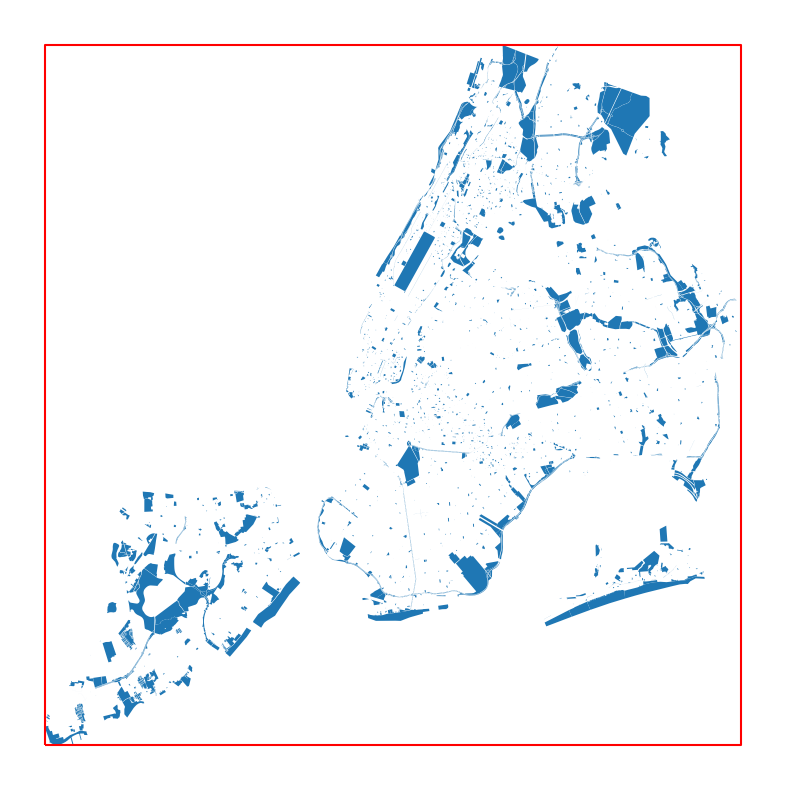

In [14]:
ax = cb_307.plot()
bounds_poly.boundary.plot(ax=ax, color="red")

## Aligning dataset projections


We saw in the previous exercise that the buildings geojson file has a CRS of EPSG:4326, which is WGS84.
Unlike desktop GIS software, GeoPandas does not reproject on-the-fly; as such, we need to explicitly align projections between our datasets to be able to work with them together.

You can check a dataset's CRS (Coordinate Reference System) with the `.crs` attribute. If this returns `None`, the dataset does not have a CRS defined and you can set it with the `.set_crs([crs-here])` method or `[dataset].crs = [crs-here]`.

In [15]:
cb_307.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [16]:
bounds_poly.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

To be able to use our bounds polygon to filter the building footprints dataset, we'll need to create a copy of the bounds that are in the right coordinate system. we can create a copy and use the `to_crs()` method to convert into the proper system

In [17]:
bounds_poly_wgs84 = bounds_poly.to_crs("EPSG:4326")

We can confirm that the CRS has changed by checking the CRS attribute again.

In [18]:
bounds_poly_wgs84.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Similar to the *attribute filter* we used previously to only load tax lots in CD 307, we can use a *spatial filter* to only load building footprints that intersect with our bounds polygon using the `mask=...` argument in our input statement.

In [19]:
cb_307_bldgs = gpd.read_file(
    "/home/sriya/mapping/cdp-mapping-systems/Data/02commute_route.geojson",
    mask=bounds_poly_wgs84[0],
)

Now let's visually inpect the buildings in the area of interest.

<Axes: >

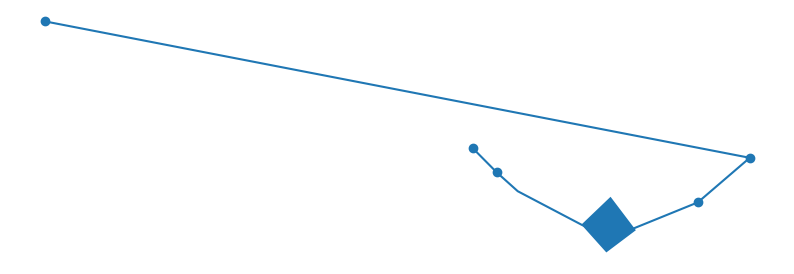

In [20]:
cb_307_bldgs.plot()

So, we are able to successfully read in the building footprints within thd study area and plot them- however, we see that there are also point representations of buildings along with the expected polygon shapes. Let's exclude point type features to be able to work specifically with polygons:

In [21]:
cb_307_bldgs = cb_307_bldgs[cb_307_bldgs.geometry.type != "Point"]

<Axes: >

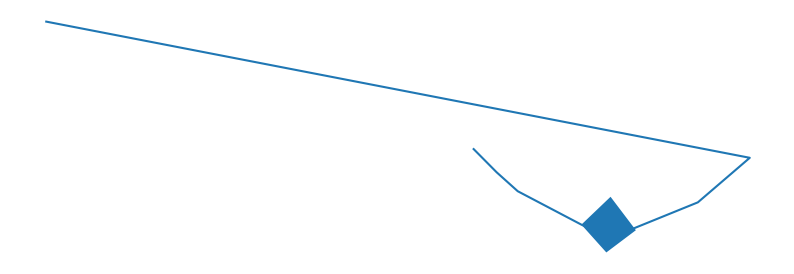

In [22]:
cb_307_bldgs.plot()

In [23]:
cb_307_bldgs = cb_307_bldgs.to_crs(cb_307.crs)

<Axes: >

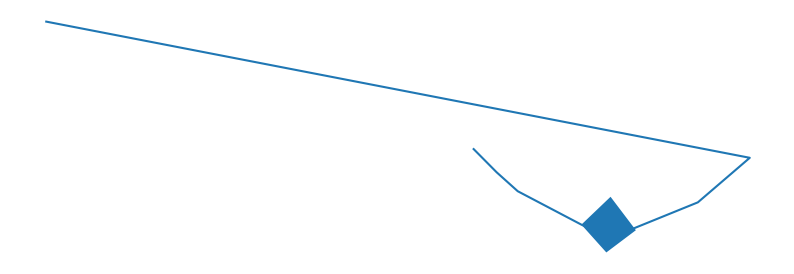

In [24]:
cb_307_bldgs.plot()

## Combine building footprints and tax lot data


To combine our building footprints with tax lots, we will compare the spatial relations between the two geometries. There are a few quirks to keep in mind:
- in some cases, buildings can cross between tax lots, leaving open the possibility that there are multiple matching tax lots for a single building footprint.
- in other cases, a building footprint may not intersect with any tax lot, such as when a building is on a sidewalk or in a park.

Because of these quirks, we will use a representation of the building footprints that is a *representative point* of the polygon, which is a single point representation of the building footprint. This will allow us to match each building footprint to a single tax lot. 

It's worth mentioning that the buildings *do* have join attributes that we could use to join the two datasets (`mpluto_bbl` and `base_bbl`), but for the purposes of this exercise, we will focus on the spatial join. 


> **Note:**  
> The `representative_point()` method is a way to get a point that is guaranteed to be within the polygon, even if the polygon is complex or has holes. This is useful for matching geometries that may not overlap perfectly. This is a related concept to the `centroid` method, which returns the center point of the polygon, but the representative point is guaranteed to be within the polygon.


To illustrate this point, we'll take a random building footprint using the `sample()` method. We'll look at it's simplified geometry using the `boundary` property, along with the representative point of the polygon.

<Axes: >

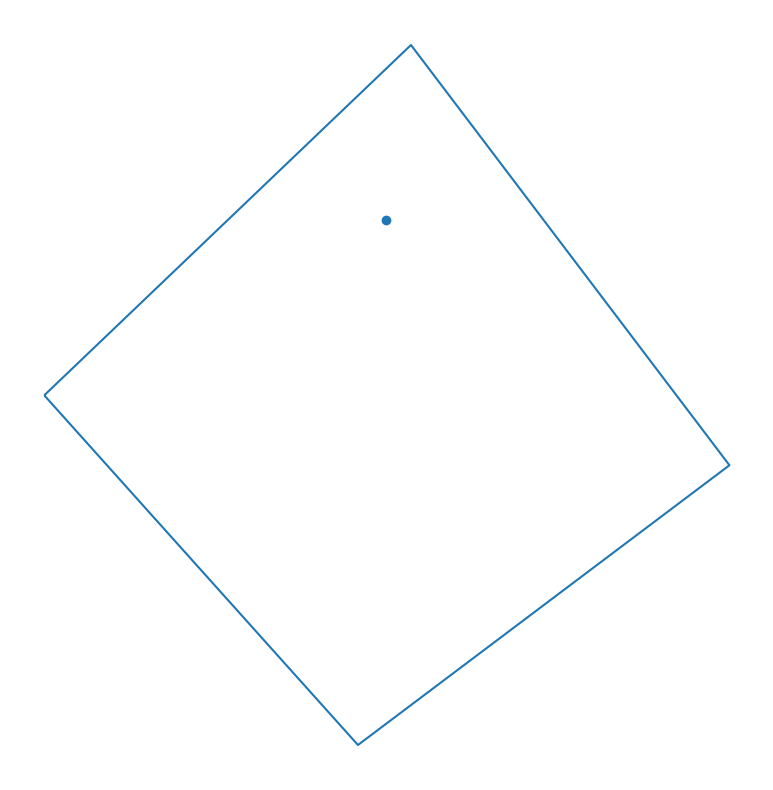

In [25]:
ss = cb_307_bldgs.sample()

ax = ss.boundary.plot()
ss.representative_point().plot(ax=ax)

Okay, now that we understand the concept of representative points, let's generate one for each building footprint in our dataset. We'll then set this column as the geometry of the GeoDataFrame so that we can use it for spatial operations (while still keeping the original geometry for reference).

In [26]:
cb_307_bldgs["rep_pt"] = cb_307_bldgs.representative_point()
cb_307_bldgs.set_geometry("rep_pt", inplace=True)

Let's take a look- we can see *two* geometry columns now, one for the original building footprint and one for the representative point.

In [27]:
cb_307_bldgs.head()

,name,route_type,frequency,avg_duration_minutes,distance_km,preferred_time,type,address,preference_rank,avg_wait_time,favorite_order,usage,specialty,usage_frequency,activity,significance,description,geometry,rep_pt
0,Daily Coffee Route,walking,weekdays,25.0,1.8,8:30-9:00 AM,None,None,NaN,None,None,None,None,None,None,None,My regular morning walk from East Village apar...,"LINESTRING (-73.98575 40.72831, -73.98512 40.7...",POINT (-73.98512 40.72783)
7,Tompkins Square Park Section,None,None,NaN,NaN,None,green_space,None,NaN,None,None,daily pass-through,None,None,None,"Only substantial green space on route, mental ...",None,"POLYGON ((-73.98289 40.72679, -73.98223 40.726...",POINT (-73.98218 40.72707)


Of course, there are plenty of cases where there are multiple buildings on a single tax lot. We can compare the number of unique tax lot ids with the number of buildings / building IDs to get a sense of this relationshp: 

In [28]:
print(cb_307_bldgs.columns)

Index(['name', 'route_type', 'frequency', 'avg_duration_minutes',
       'distance_km', 'preferred_time', 'type', 'address', 'preference_rank',
       'avg_wait_time', 'favorite_order', 'usage', 'specialty',
       'usage_frequency', 'activity', 'significance', 'description',
       'geometry', 'rep_pt'],
      dtype='object')


In [30]:
# Check the columns in the new GeoJSON file
buildings_gdf = gpd.read_file("/home/sriya/mapping/cdp-mapping-systems/Data/02commute_route.geojson")
print("Columns in the buildings GeoJSON:")
print(buildings_gdf.columns.tolist())

# Show the first few rows to understand the data structure
print("\nFirst few rows of the data:")
display(buildings_gdf.head(2))

Columns in the buildings GeoJSON:
['name', 'route_type', 'frequency', 'avg_duration_minutes', 'distance_km', 'preferred_time', 'type', 'address', 'preference_rank', 'avg_wait_time', 'favorite_order', 'usage', 'specialty', 'usage_frequency', 'activity', 'significance', 'description', 'geometry']

First few rows of the data:


,name,route_type,frequency,avg_duration_minutes,distance_km,preferred_time,type,address,preference_rank,avg_wait_time,favorite_order,usage,specialty,usage_frequency,activity,significance,description,geometry
0,Daily Coffee Route,walking,weekdays,25.0,1.8,8:30-9:00 AM,None,None,NaN,None,None,None,None,None,None,None,My regular morning walk from East Village apar...,"LINESTRING (-73.98575 40.72831, -73.98512 40.7..."
1,Home,None,None,NaN,NaN,None,residence,E 7th Street,NaN,None,None,None,None,None,None,Starting point of daily journey,None,POINT (-73.98575 40.72831)


In [32]:
# Let's check the contents of your GeoJSON file
route_gdf = gpd.read_file("/home/sriya/mapping/cdp-mapping-systems/Data/02commute_route.geojson")
print("Columns in the route data:")
print(route_gdf.columns.tolist())

# Show the first few rows to understand the data
print("\nFirst few rows of the route data:")
display(route_gdf.head())

Columns in the route data:
['name', 'route_type', 'frequency', 'avg_duration_minutes', 'distance_km', 'preferred_time', 'type', 'address', 'preference_rank', 'avg_wait_time', 'favorite_order', 'usage', 'specialty', 'usage_frequency', 'activity', 'significance', 'description', 'geometry']

First few rows of the route data:


,name,route_type,frequency,avg_duration_minutes,distance_km,preferred_time,type,address,preference_rank,avg_wait_time,favorite_order,usage,specialty,usage_frequency,activity,significance,description,geometry
0,Daily Coffee Route,walking,weekdays,25.0,1.8,8:30-9:00 AM,None,None,NaN,None,None,None,None,None,None,None,My regular morning walk from East Village apar...,"LINESTRING (-73.98575 40.72831, -73.98512 40.7..."
1,Home,None,None,NaN,NaN,None,residence,E 7th Street,NaN,None,None,None,None,None,None,Starting point of daily journey,None,POINT (-73.98575 40.72831)
2,Joe Coffee,None,None,NaN,NaN,None,coffee_shop,None,1.0,3 minutes,Cortado,None,None,None,None,Primary coffee stop - knows my order,None,POINT (-73.98512 40.72783)
3,Tompkins Square Park Bench,None,None,NaN,NaN,None,rest_point,None,NaN,None,None,None,None,3x per week,"reading, people watching","Mental reset point, connection to nature",None,POINT (-73.98213 40.72652)
4,Abraco Coffee,None,None,NaN,NaN,None,coffee_shop,None,2.0,None,None,backup when Joe is crowded,Espresso,None,None,Alternative route option,None,POINT (-73.97982 40.72723)


In [36]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon

# Load the route data
route_gdf = gpd.read_file("/home/sriya/mapping/cdp-mapping-systems/Data/02commute_route.geojson")

# Create a map centered on your route
route = route_gdf[route_gdf['name'] == 'Daily Coffee Route'].iloc[0]
m = folium.Map(location=[route.geometry.centroid.y, route.geometry.centroid.x], zoom_start=16)

# Add the route line
folium.GeoJson(route.geometry, 
              style_function=lambda x: {'color': 'blue', 'weight': 4, 'opacity': 0.7}).add_to(m)

# Add markers for each point of interest
for idx, row in route_gdf[1:].iterrows():
    if not row['geometry'].is_empty:
        # Get coordinates based on geometry type
        if isinstance(row.geometry, Point):
            coords = [row.geometry.y, row.geometry.x]
        elif isinstance(row.geometry, Polygon):
            coords = [row.geometry.centroid.y, row.geometry.centroid.x]
        else:
            continue  # Skip if not Point or Polygon
            
        # Customize the icon based on location type
        if row['type'] == 'coffee_shop':
            icon_color = 'red'
            icon = 'coffee'
        elif row['type'] == 'residence':
            icon_color = 'green'
            icon = 'home'
        else:
            icon_color = 'blue'
            icon = 'info-sign'
        
        # Create popup with location details
        popup_parts = [f"<b>{row['name']}</b>"]
        if pd.notna(row.get('type')):
            popup_parts.append(f"Type: {row['type']}")
        if pd.notna(row.get('preference_rank')):
            popup_parts.append(f"Rank: {int(row['preference_rank'])}")
        if pd.notna(row.get('favorite_order')):
            popup_parts.append(f"Order: {row['favorite_order']}")
        if pd.notna(row.get('avg_wait_time')):
            popup_parts.append(f"Wait: {row['avg_wait_time']}")
        if pd.notna(row.get('significance')):
            popup_parts.append(f"Notes: {row['significance']}")
        
        folium.Marker(
            location=coords,  # Use the coordinates we determined
            popup=folium.Popup("<br>".join(popup_parts), max_width=300),
            icon=folium.Icon(color=icon_color, icon=icon, prefix='fa')
        ).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map
m

Next we'll perform additional geometric operations to identify the portions of tax lots that are not covered by buildings. This workflow demonstrates how to create a new dataset based on existing inputs.

To begin, we'll choose a random block within CB 307.

In [49]:
sample_block = cb_307.Block.sample(1).values[0]

AttributeError: 'GeoDataFrame' object has no attribute 'Block'

Now we'll select the blocks and building footprints that match the randomly selected block, and will create new dataframes for each.

In [135]:
sample_block_lots = cb_307[cb_307.Block.eq(sample_block)].copy()
sample_block_bldgs = cb_307_bldgs[
    cb_307_bldgs.mappluto_bbl.isin(sample_block_lots.BBL.unique())
].copy()

In [136]:
sample_block_bldgs.set_geometry("geometry", inplace=True)

We can plot those to visually inspect the sampled block, lots, and building footprints.

Text(0.5, 1.0, 'Block 793')

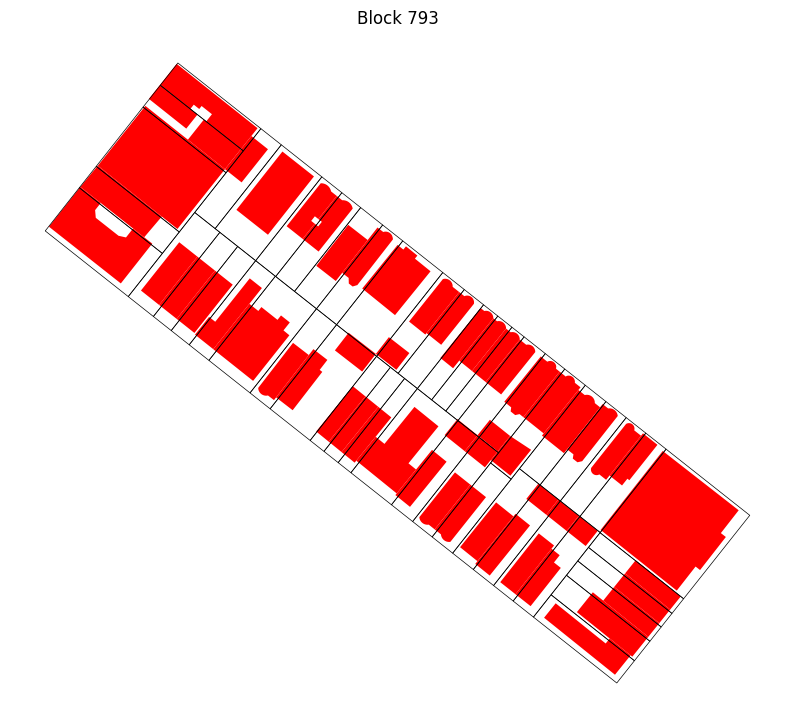

In [137]:
ax = sample_block_lots.boundary.plot(color="black", linewidth=0.5)
sample_block_bldgs.plot(ax=ax, color="red")

ax.set_title(f"Block {sample_block}")

Next we can identify the portions of the block that are *not* buildings by calculating the `difference` between the lots and the buildings. We will use the `unary_union` property of the buildings dataframe, which represents a [union of all geometries in the dataframe](https://geopandas.org/en/v0.10.0/docs/reference/api/geopandas.GeoSeries.unary_union.html). It is essentially a shortcut to a dissolve of all geometries in a dataframe. 

With these chained commands, we will return the area of each tax lot that is not a building.

In [138]:
sample_block_non_bldg = sample_block_lots.difference(sample_block_bldgs.unary_union)

/tmp/ipykernel_6440/3284385118.py:1: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  sample_block_non_bldg = sample_block_lots.difference(sample_block_bldgs.unary_union)


We can plot the results to confirm that each lot still exists as its own feature (blue with black outlines) and are separate from the orange building polygons. Note that in some cases, lots may be split into two distinct areas, making them *MultiPolygons*.

<Axes: >

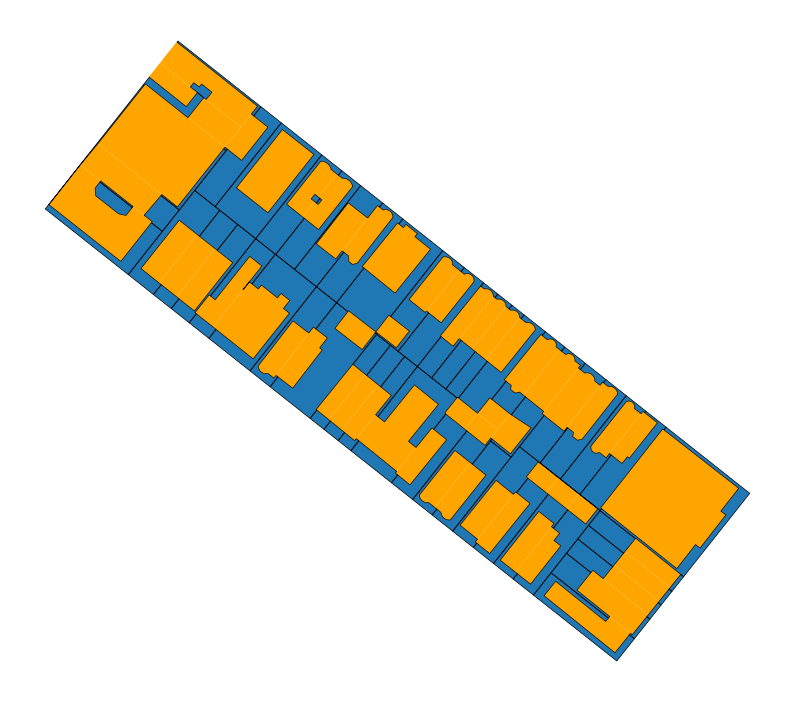

In [139]:
ax = sample_block_non_bldg.boundary.plot(color="black", linewidth=0.5)
sample_block_non_bldg.plot(ax=ax)
sample_block_bldgs.plot(ax=ax, color="orange")

We could use this new dataset to calculate the *lot coverage* of each lot, which could be useful in a soft site analysis (continued below). Next we will explore another means of calculating lot coverage by *unioning* features instead of taking the intersection.

## Union


We'll continue using the sample block we identified above. We'll start by calculating the lot area of each lot in our sample.

In [140]:
sample_block_lots["lot_area"] = sample_block_lots.area

Now we'll perform a *union* between the lots and the building footprints. A union, like the *difference* performed above, is a kind of *overlay* method that we can apply between multiple dataframes. (For more information on other overlay methods, check out [the documentation](https://geopandas.org/en/v0.10.0/docs/user_guide/set_operations.html)). The `union` operation retains all geometry of the input layers, as well as the attributes of each based on the overlap. 


<img src="https://geopandas.org/en/v0.10.0/_images/overlay_operations.png" alt="Geopandas overlay operations" width="600"/>

*Source: QGIS Documentation via Geopandas docs*

A union would take the following input:

<img src="https://geopandas.org/en/v0.10.0/_images/overlay_example.png" alt="Geopandas overlay operations" width="600"/>

and produce the following output: 

<img src="https://geopandas.org/en/v0.10.0/_images/overlay_example_union.png" alt="Geopandas overlay operations" width="600"/>


In [141]:
lots_bldgs_union = gpd.overlay(sample_block_lots, sample_block_bldgs, how="union")

A union will produce features that have geometry entries (based on the union operation), as well as attributes from both input datasets *so long as there is coverage of that dataset*. In our example, there will be full attributes of both datasets for the portion of the lots that are buildings, but the other portions of lots will not have attributes from the buildings dataset. 

In [142]:
lots_bldgs_union.head()

,Borough,Block,Lot,CD,BCT2020,BCTCB2020,CT2010,CB2010,SchoolDist,Council,...,feature_code,shape_length,height_roof,last_status_type,bin,last_edited_date,geom_source,doitt_id,rep_pt,geometry
0,BK,793.0,21.0,307.0,3009800,30098003000,98,3000,15,43.0,...,2100,55.739678362370555,29.8,Constructed,3013354,2017-08-22 15:47:45+00:00,Photogrammetric,17945,POINT (982306.413 173506.203),"POLYGON ((982284.612 173487.677, 982283.436 17..."
1,BK,793.0,21.0,307.0,3009800,30098003000,98,3000,15,43.0,...,2100,63.3078723873374,29.93,Constructed,3013353,2017-08-22 15:47:25+00:00,Photogrammetric,303180,POINT (982296.416 173519.029),"POLYGON ((982303.543 173539.999, 982306.572 17..."
2,BK,793.0,23.0,307.0,3009800,30098003000,98,3000,15,43.0,...,5110,35.991099061256165,9.43,Constructed,3350748,2017-08-17 16:24:54+00:00,Photogrammetric,858909,POINT (982303.928 173401.645),"POLYGON ((982299.906 173416.618, 982300.352 17..."
3,BK,793.0,23.0,307.0,3009800,30098003000,98,3000,15,43.0,...,5110,35.439826443544916,9.61,Constructed,3350744,2017-08-17 16:38:57+00:00,Photogrammetric,895628,POINT (982316.076 173416.83),"POLYGON ((982302.295 173415.622, 982300.352 17..."
4,BK,793.0,23.0,307.0,3009800,30098003000,98,3000,15,43.0,...,2100,66.764912380002414,48.02307615,Constructed,3013356,2017-08-22 15:42:49+00:00,Photogrammetric,611667,POINT (982353.023 173464.084),"POLYGON ((982327.956 173448.106, 982326.209 17..."


We can illustrate that point by mapping the output layer. In the below example, we filter for cases where the `globalid` (which is associated with the buildings dataset) is null (`.isna()`) in grey. Cases where the `globalid` is *not* null are red.

<Axes: >

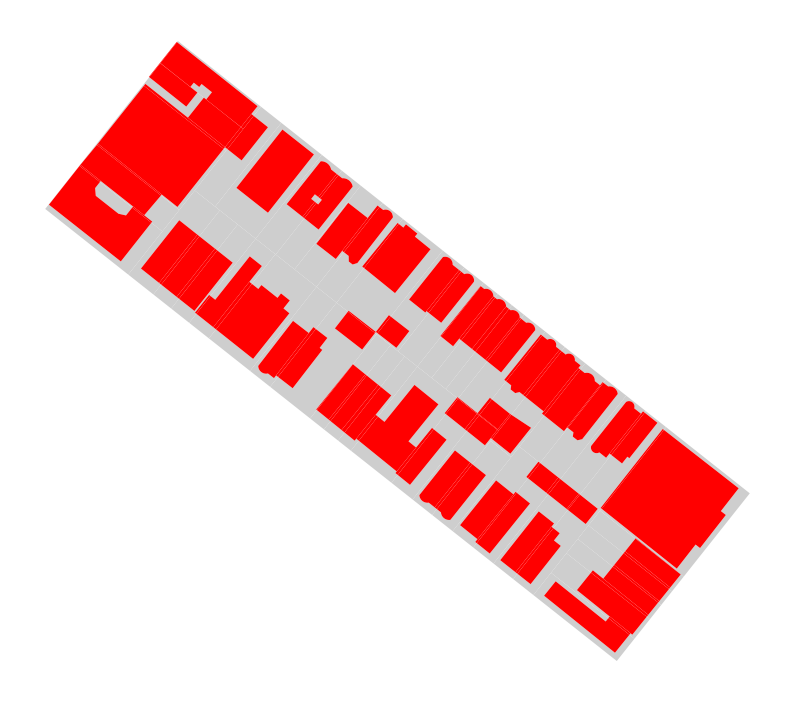

In [144]:
ax = lots_bldgs_union[lots_bldgs_union.bin.isna()].plot(color="#cecece")
lots_bldgs_union[lots_bldgs_union.bin.notna()].plot(ax=ax, color="red")

We can also plot based on a shared attribute to demonstrate that both portions of the lots (building and non-building) are part of the same lot. Plotting the boundary separately confirms that each segment of the building/lot combination is in fact a separate feature.

<Axes: >

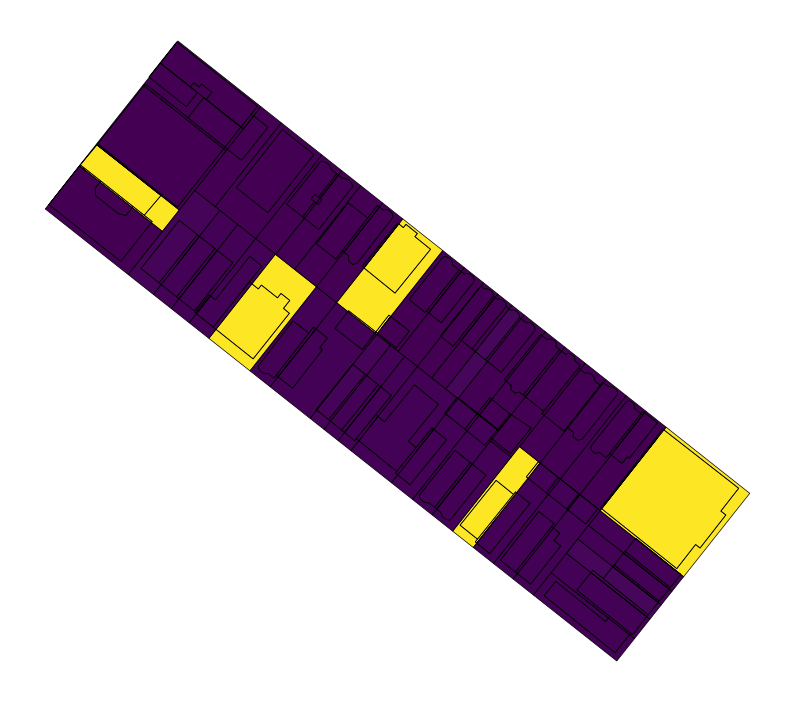

In [146]:
ax = lots_bldgs_union[lots_bldgs_union.bin.isna()].plot("Lot")
lots_bldgs_union[lots_bldgs_union.bin.notna()].plot("Lot", ax=ax)
lots_bldgs_union.boundary.plot(color="black", ax=ax, linewidth=0.5)

Finally, we can create a new attribute field that represents the *percent of the lot that is covered by a building* as discussed above. The below operation uses a *lambda* function, which is a way to iterate through a dataframe and perform a calculation on each row (or column, based on the `axis=...` argument). The function can be understood as follows:
- `lambda x: ... axis=1` for each row (`x`, based on the `1` axis value), perform the following operation
- `((x.geometry.area / x.lot_area)*100...)`: take the geometry of each piece of the unioned dataframe, calculate the area, divide it by the lot area (which we calculated above, pre-union), and multiply by 100 to get a percentage
- `if type(x.globalid) == str else -1`: only do this for the input features that are pieces of buildings (e.g. they have a `globalid`), otherwise return a placeholder value of `-1`. This number is negative on purpose so it is easy to filter out, but you could also use `None` or `NaN` if you prefer.

As you can see, we can perform a multi-step operation using a `lambda` function. For more complex operations, it makes sense to write standalone functions for legibility- we'll demonstrate that in the following section. There is no hard rule for legibility vs. brevity (i.e. lambda vs standalone functions), so use your best judgement. What's important is that you or your user understand what the code is doing.

In [148]:
lots_bldgs_union["pct_bldg_lot_coverage"] = lots_bldgs_union.apply(
    lambda x: ((x.geometry.area / x.lot_area) * 100 if type(x.bin) == str else -1),
    axis=1,
)

Now let's plot and see the percentage of each lot that is covered by buildings. This could be expressed in a number of different ways (e.g. at the lot level) but we can get a sense of the utility of the `union` operation.

<Axes: >

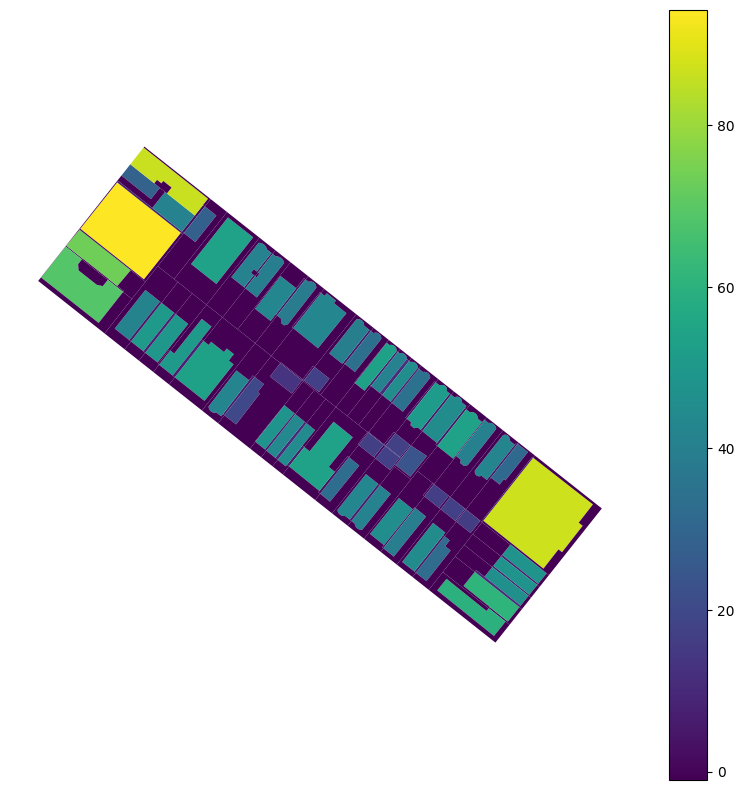

In [149]:
lots_bldgs_union.plot("pct_bldg_lot_coverage", legend=True)

## Creating new attributes


In this example, we'll develop a function that indicates whether a site is a "soft site" or not. A "soft site" is a site that meets certain criteria for redevelopment. The factors below represent just a few of the considerations that are often taken to determine whether a site may be a good candidate for redevelopment, but this is a simplistic example case to illustrate a point rather than a firm ruleset.

Because we are considering a few different factors, we will write a new *function* vs. chaining criteria together in a `lambda` function (although you could use the same kind of syntax above to perform the same work). 

There are several important components to consider.

`def [function_name]([input_args...]):` 
The instantiation of the function is important. We are *defining* (`def`) a new function, giving it a name (in this case, `is_soft_site`), and indicating that there are two possible input arguments: `r`, which is a common shorthand for a row in a dataset, and the optional argument `threshold`. This is *optional* and comes with a default value of `0.33`, meaning that if a user doesn't specify a threshold, `0.33` will be used. You could imagine other cases where required or optional arguments might be useful!

`if (...): return 1 else: return 0`
This is the part of the function that is evaluating properties of our input `r` based on it's properties. We can see the evaluation of its `BuiltFAR` compared to the lot's `ResidFAR` (allowed residential FAR) times the `threshold` set here. We are determining whether the site is built less than or equal to 33% of the allowable residential FAR. 

We then evaluate the lot area, existing land use, and whether there is available residential FAR at all to indicate that yes, this is a soft site, or no, it is not. The `return` statements are what pass that information back to us: if those conditions are met, we get a `1`, otherwise a `0`.

Functions don't necessarily have to return anything, but in this case we will be using this logic to create a new field and so want to be sure that *something* is always returned.

In [150]:
def is_soft_site(r, threshold=0.33):
    if (
        r.BuiltFAR <= r.ResidFAR * threshold
        and r.LotArea > 10000
        and r.LandUse != "Open Space & Outdoor Recreation"
        and r.ResidFAR > 0
    ):
        return 1
    else:
        return 0

We can invoke the function using the `apply()` method- here we pass in the function name, and specify that we want to apply the function to each *row* (`axis=1`) vs each *column* (`axis=0`) of our table. 

If we wanted to pass in a `threshold` value, we could pass in a tuple of arguments: `...apply(is_soft_site, axis=1, args=(0.5,))` which is then passed in as a different threshold. Part of the point of providing these optional attributes is to make it easier for you / your users to make changes quickly- in a more complex example you might also have arguments for your lot area thresholds, the land uses that are off limits, etc.

In [151]:
cb_307["soft_site"] = cb_307.apply(is_soft_site, axis=1)

Now let's check how many soft sites we have in the neighborhood based on the criteria we defined above. Because we use 1/0 values to distinguish soft sites from not, we can use the `value_counts()` method to get a quick overview of the number of soft sites in the neighborhood.

In [152]:
cb_307["soft_site"].value_counts()

soft_site
0    13233
1       37
Name: count, dtype: int64

Now let's create a quick map to see where our soft sites are. What do you notice about the distribution of sites?

Text(0.5, 1.0, 'Soft Sites in Community Board 307')

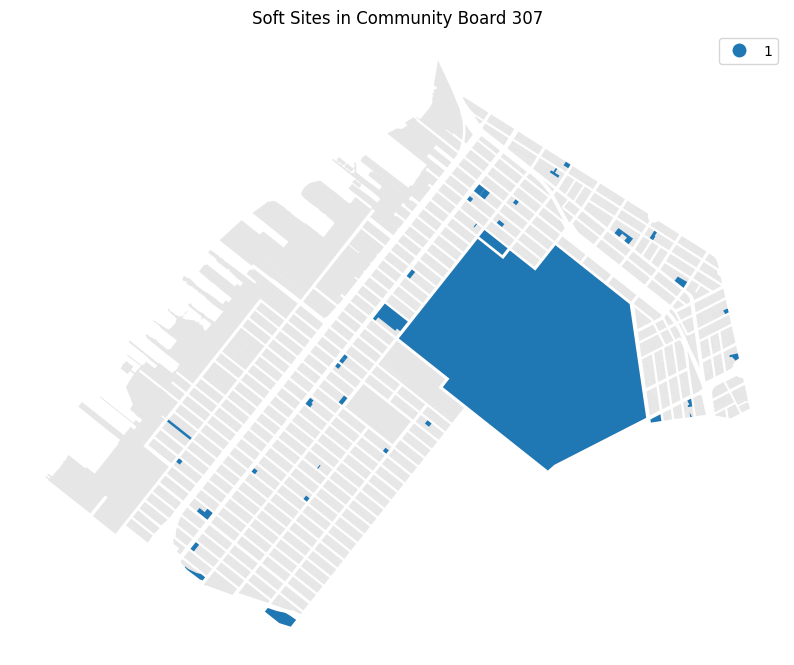

In [153]:
ax = cb_307.plot(color="#cecece", alpha=0.5)
cb_307[cb_307.soft_site > 0].plot("soft_site", ax=ax, legend=True, categorical=True)
plt.title("Soft Sites in Community Board 307")

In [154]:
cb_307[cb_307.soft_site.eq(1)][["soft_site", "BuiltFAR", "ResidFAR"]]

,soft_site,BuiltFAR,ResidFAR
129,1,0.09,2.00
177,1,0.00,6.02
2621,1,0.00,2.00
3216,1,1.24,4.00
3223,1,0.18,4.00
3331,1,0.41,1.35
3544,1,0.40,2.00
4014,1,0.65,4.00
4015,1,0.19,4.00
4062,1,0.22,4.00


In [155]:
# map soft sites
soft_sites = cb_307[cb_307.soft_site.eq(1)].copy().to_crs("EPSG:4326")
soft_sites["ResidFAR"]

lots_layer = PolygonLayer.from_geopandas(
    soft_sites[["geometry", "ResidFAR"]],
    extruded=True,
    get_elevation=soft_sites["ResidFAR"] * 15,  # scale elevation for visibility
    pickable=True,
)

base_layer = PolygonLayer.from_geopandas(
    cb_307[["geometry", "LandUse"]].to_crs("EPSG:4326"),
    get_fill_color=[200, 200, 200, 155],
)

m = Map(
    [base_layer, lots_layer],
    view_state={
        "pitch": 45,
        "zoom": 14,
        "latitude": 40.6459406,
        "longitude": -74.0151512,
    },
)
m

Map(layers=[PolygonLayer(get_fill_color=[200, 200, 200, 155], table=pyarrow.Table
LandUse: string
geometry: li…